# ADRL Assignment 3 (Q1 part 2) <br>
## Team:<br>
#### Anmol Anil Dhanuka (SR No: 21989)<br>
#### Sharath C R (SR No: 21744)<br>
#### Unity Chachei (SR No: 21916) <br>

# Problem1 part 2

- Kaggle dataset for animal images used (Dataset has 16130 images of cats, dogs and wild animals)
- Objective:
    - Take  the  VAE implemented in Assignment 1
    - Use it to implement a class-conditional DDPM on its latent space
    - Use classifier guidance with the score-based formulation


## Import required Python libraries

In [ ]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
import matplotlib.pyplot as plt
from torch.distributions import MultivariateNormal
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from mpl_toolkits.axes_grid1 import ImageGrid
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from torchvision import datasets
from tqdm import tqdm

## Loading data from the folders

- Compose a transform with:
    - Images resized to (3,128,128)
    - Convert images to Torch tensor
<br>
<br>        
        
- Load the images from the folder with a batch size of 100

In [ ]:
transform = transforms.Compose(
    [
        transforms.Resize(size=128),
        transforms.ToTensor()
    ]

)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#train_data = datasets.ImageFolder('/content/drive/MyDrive/ADRL Assignment/data/',transform=transform)
train_data = datasets.ImageFolder('.\\archive\\afhq\\train\\',transform=transform)
batch_size = 100
train_loader = DataLoader(train_data,batch_size=batch_size,shuffle=True,num_workers=4)

## Samples image grid

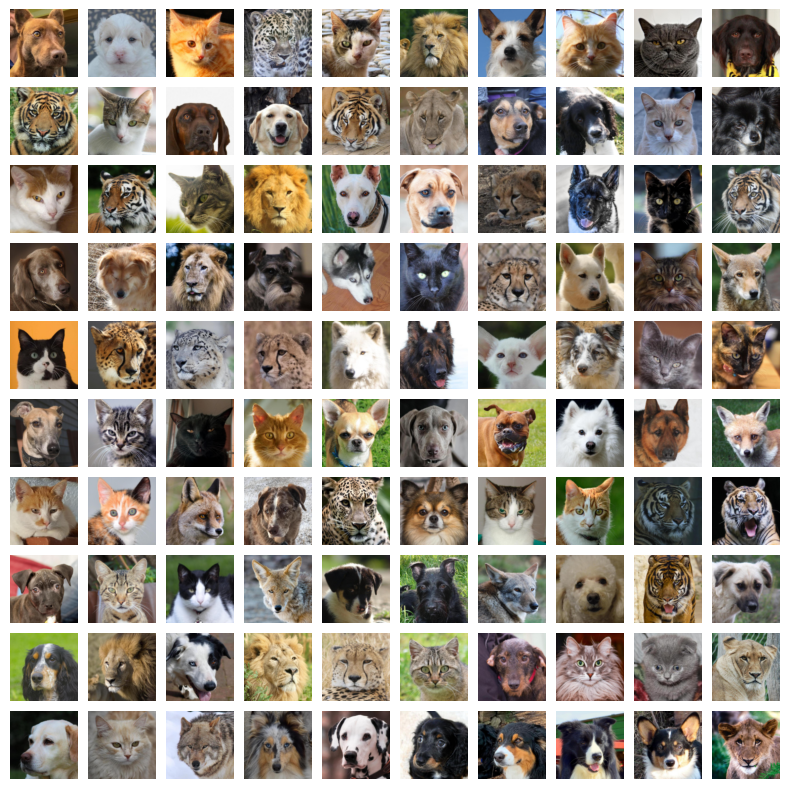

In [ ]:
image,_ = next(iter(train_loader))


num_samples = 100
sample_images = image.permute(0,2,3,1)[0:num_samples]

fig = plt.figure(figsize=(10, 10))
grid = ImageGrid(fig, 111, nrows_ncols=(10, 10), axes_pad=0.1)

for ax, im in zip(grid, sample_images):
    ax.imshow(im)
    ax.axis('off')

plt.show()

## VAE Model


### Model

Input data: x $\sim$ $P_{x}$ ; x $\epsilon$ $R^{d}$<br>
Output data: $\hat{x}$ $\sim$ $P_{\theta}(x|z)$ ; $\hat{x}$ $\epsilon$ $R^{d}$<br> <br>

Encoder input: <br>
> x $\sim$ $P_{x}$ where $P_{x}$ is the True Data Distribution <br>
<br>

Encoder outputs: <br>
> $\mu_{\phi}$ $\epsilon$ $R^{k}$ <br>
> $\Sigma_{\phi}$ $\epsilon$ $R^{k}$ <br>
> Where k is the latent dimension (k = 128 in the model below) <br>
> Note: Here $\Sigma_{\phi}$ is assumed to be a Diagonal Covariance <br>
> Modelling choice of encoder: $Q_{\phi}(z|x)$ $\sim$ $N(x;\mu_{\phi},\Sigma_{\phi})$
<br>

Decoder input: <br>
> z = $\mu_{\phi}$ + $\Sigma_{\phi}\odot\epsilon$ through reparameterization <br>
> Where $\epsilon$ $\sim$ N(0,1) <br>
> Modelling choice for generators input: $P_{\theta}(z)$ $\sim$ $N(z;0,I)$
<br>

Decoder output: <br>
> $\hat{x}$ $\sim$ $P_{\theta}(x|z)$ <br>
> Modelling choice: $P_{\theta}(x|z)$ $\sim$ $N(x;\hat{x},I)$

### Loss Function

#### Objective: ELBo maximization <br>

> ELBo = $\underset{Q_{\phi}(z|x)}{E}logp_{\theta}(x|z)\:-\:D_{KL}(q_{\phi}(z|x)||p_{\theta}(z))$ <br> <br>

#### Reconstruction Loss: <br>
> Reconstruction loss: $\underset{Q_{\phi}(z|x)}{E}log(p_{\theta}(x|z))$ = $-\frac{1}{L}||x\:-\:\hat{x}||_{2}^{2}$ <br>
> L: number of instances of z input to the decoder <br> <br>
> Note: The division by L is when only 1 instance of x is input to the encoder and trained (i.e. only one $\mu_{\phi}$ and $\Sigma_{\phi}$) <br> <br>
> For the case when a batch of x is provided to the encoder, the Reconstruction loss becomes: $-\frac{1}{M}||x\:-\:\hat{x}||_{2}^{2}$ <br>
> where M = N * L ; N : batch size <br> <br>
> Note: <br>
> For $P_{\theta}(x|z)$ $\sim$ $N(x;\hat{x},I)$ , the Reconstruction loss takes MSE loss structure (i.e. Norm) <br>
> For $P_{\theta}(x|z)$ $\sim$ Bernoulli distribution, the Reconstruction loss takes Binary Cross Entropy loss structure <br>

#### KLD Loss: <br>
> $D_{KL}(q_{\phi}(z|x)||p_{\theta}(z))$ = $\frac{1}{2}[\mu_{\phi}^{T}\mu_{\phi}\:+\:tr(\Sigma_{\phi})\:-\:k\:-\:log|\Sigma_{\phi}|]$ <br> <br>
> $D_{KL}(q_{\phi}(z|x)||p_{\theta}(z))$ = $-\frac{1}{2}[\underset{i}{\sum}(log\sigma_{i}^{2}\:+\:1)\:-\:\underset{i}{\sum}\sigma_{i}^{2}\:-\:\underset{i}{\sum}\mu_{i}^{2}]$ <br>
> For the KLD Loss in the model below, the mean of this value is taken across M as the KLD loss is for each $\mu_{\phi}$ and $\Sigma_{\phi}$ <br>

#### Total Loss: <br>
> L($\theta$, $\phi$) = $\underset{\theta,\phi}{\max}$ (Reconstruction Loss - $\beta$*KLD Loss) = $\underset{\theta,\phi}{\min}$ (-Reconstruction Loss + $\beta$*KLD Loss)<br> <br>
> $\beta$ = 1 for Vanilla VAE (For Beta-VAE experiments, the beta is varied and observations are documented) <br>
> Pytorch implements loss minimization


### Generator Function

> During training, the $Q_{\phi}(z|x)$ distribution has been made to follow $P_{\theta}(z)$ through the minimization of KLD Loss term <br>
> For Generation now, we can sample from $P_{\theta}(z)$ $\sim$ $N(z;0,I)$ and input to Decoder <br>


### Hyper-parameters for Training

> k : Latent dimension <br>
> L : Number of instances of z input to the decoder <br>
> Learning rate: {1e-3, 1e-4} <br>


### Model Parameters

> k : 256 <br>
> Batch size : 100 (sometimes 10 used when L value was more than 1 to reduce compute complexity) <br>
> Input image dimensions: (3,128,128) <br>
> Output image dimensions: (3,128,128) <br>
> Optimizer used: Adam <br>
> Number of epochs: 100 <br>
> Data size: 14630 images (train data only)




### Note: Here Beta value was taken as 0 to implement an auto-encoder instead of VAE and sample from latent space (This gives better reconstruction and this way Auto-encoders are used in Stable diffusion)

In [ ]:
class VAE(nn.Module):

    def __init__(self,Encoder_sel ,Decoder_sel, input_dim = 3*128*128, hidden_dim_1 = 2048, hidden_dim_2 = 512, latent_dim = 256, device=device):
        super(VAE, self).__init__()


        self.encoder = nn.Sequential(
            # input is 3*128*128
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            # input is 64*64*64
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            # input is 128*32*32
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            # input is 256*16*16
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # input is 512*8*8
            nn.Conv2d(512, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # input is 512*4*4
            nn.Flatten(1,3),
            nn.Linear(512*4*4, 512*2*2),
            nn.ReLU(),
            nn.Linear(512*2*2, hidden_dim_2),
            nn.ReLU()
            )



        # Get the Latent Mean and Variance
        self.mean_layer = nn.Linear(hidden_dim_2, latent_dim)
        self.logvar_layer = nn.Linear(hidden_dim_2, latent_dim)



        self.decoder = nn.Sequential(

            nn.Linear(latent_dim, 512*1*1),
            nn.LeakyReLU(0.2),
            nn.Linear(512*1*1, 512*2*2),
            nn.LeakyReLU(0.2),
            nn.Linear(512*2*2, 512*4*4),
            nn.LeakyReLU(0.2),
            nn.Unflatten(1,(512,4,4)),
            # input is 512*4*4
            nn.ConvTranspose2d(64 * 8, 64 * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 8),
            nn.ReLU(True),
            # input is 512*8*8
            nn.ConvTranspose2d( 64 * 8, 64 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 4),
            nn.ReLU(True),
            # input is 256*16*16
            nn.ConvTranspose2d( 64 * 4, 64*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64*2),
            nn.ReLU(True),
            # input is 128*32*32
            nn.ConvTranspose2d( 64*2, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # input is 64*64*64
            nn.ConvTranspose2d(64,3, 4, 2, 1, bias=False),
            nn.Tanh()
            # output is 3*128*128
        )



    def encode(self, x):
        """
        Function to pass through Encoder and output mean and variance
        """
        x = self.encoder(x)
        mean, logvar = self.mean_layer(x), self.logvar_layer(x)
        return mean, logvar

    def reparameterization(self, mean, var):
        """
        Function to apply Reparameterization trick
        """
        eps_diag = torch.randn(len(var)).to(device)
        eps = torch.diag(eps_diag).to(device)
        z = mean + torch.matmul(eps,var)
        z = z.to(device)
        return z

    def decode(self, x):
        """
        Function to pass through Decoder
        """
        return self.decoder(x)


    def forward(self, x, num_z):
        """
        Function to take input through a forward pass of the model.
        """
        mean, log_var = self.encode(x)
        mean = mean.repeat_interleave(num_z,dim=0)
        log_var = log_var.repeat_interleave(num_z,dim=0)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var))
        x_hat = self.decode(z)
        return x_hat, mean, log_var


def loss_function(x, x_hat, mean, log_var, num_z, loss_type, reduction_type = 'sum' , beta=1):
    """
    Function to define the VAE Loss Function. This also includes beta which is set to 1 for VAE.
    """
    x = x.repeat_interleave(num_z,dim=0)
    if(loss_type == 'BCE'):
        if(reduction_type == 'sum'):
            reproduction_loss = F.binary_cross_entropy(x_hat, x,reduction=reduction_type)/len(x)
        elif(reduction_type == 'mean'):
            reproduction_loss = F.binary_cross_entropy(x_hat, x, reduction=reduction_type)
    elif(loss_type == 'MSE'):
        if(reduction_type == 'sum'):
            reproduction_loss = F.mse_loss(x_hat, x,reduction=reduction_type)/len(x)
        elif(reduction_type == 'mean'):
            reproduction_loss = F.mse_loss(x_hat, x,reduction=reduction_type)

    KLD = torch.mean(-0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp(),dim=1),dim=0)
    return (reproduction_loss + (beta * KLD)),reproduction_loss,KLD



def train(model, optimizer, epochs, device, loss_type, reduction_type, num_z, beta):
    """
    Function to run the training loop.
    """

    Reconst_loss_list = []
    KLD_loss_list = []
    for epoch in range(epochs):

        # model.encoder.train()
        # model.decoder.train()
        model.train()
        for batch_idx, (x, _) in tqdm(enumerate(train_loader),total=len(train_loader),desc="VAE",colour="GREEN"):
            x = x.to(device)
            #Forward pass
            x_hat, mean, log_var = model(x,num_z = num_z)
            x = torch.flatten(x,start_dim=1,end_dim=3)
            x_hat = torch.flatten(x_hat,start_dim=1,end_dim=3)

            #Loss function
            loss,R_loss,KLD_loss = loss_function(x, x_hat, mean, log_var,num_z=num_z, loss_type=loss_type, reduction_type = reduction_type, beta=beta)

            #Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print(f"\tEpoch: {epoch + 1}/{epochs} | Rec Loss: {R_loss:.6f} | KLD_loss: {KLD_loss:.6f} | Total loss: {loss:.6f}")

        if (epoch+1) % 10 == 0:

            torch.save({
                'D_state_dict': model.decoder.state_dict(),
                'E_state_dict': model.encoder.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, '.\models_state_dict_AE5_{}.tar'.format(epoch+1))



        # Saving loss terms for plotting.
        Reconst_loss_list.append(R_loss)
        KLD_loss_list.append(KLD_loss)

    model.eval()

    plot_grid(model,latent_dim = 256, num_samples = 100, x = image, plot_reconstruction = True, num_z = 1)

    return Reconst_loss_list,KLD_loss_list


def generate_image(n_samples, model, z_val, x = [], plot_reconstruction = False, num_z = 1):
    """
    Function to generate images on a 10x10 grid
    """
    x_decoded = torch.zeros((n_samples,3,128,128)).to(device)
    z_val = z_val.to(device)

    x_decoded = model.decode(z_val)

    x_decoded = x_decoded.detach().cpu().reshape(n_samples,3, 128, 128) # reshape vector to 2d array

    # fig = plt.figure(figsize=(10, 10))
    # grid = ImageGrid(fig, 111, nrows_ncols=(10, 10), axes_pad=0.1)


    # for ax, im in zip(grid, x_decoded):
    #     ax.imshow(im.permute(1,2,0))
    #     ax.axis('off')

    # fig.suptitle('Generated Images (10x10) - Sampling latent space and passing through Decoder')
    # plt.show()

    # Plot reconstructed images only if necessary
    if(plot_reconstruction):
        x = x.to(device)
        x_hat,_,_ = model.forward(x,num_z)
        x_hat = x_hat.detach().cpu().reshape(n_samples,3, 128, 128)
        fig2 = plt.figure(figsize=(10, 10))
        grid2 = ImageGrid(fig2, 111, nrows_ncols=(10, 10), axes_pad=0.1)


        for ax, im in zip(grid2, x_hat):
            ax.imshow(im.permute(1,2,0))
            ax.axis('off')

        fig2.suptitle('Reconstructed Images (10x10) - Forward pass of the model')
        plt.show()

def plot_grid(model, latent_dim = 128, num_samples = 100, x = [], plot_reconstruction = False, num_z = 1):
    """
    Function to generate z and create images through the model.
    """
    p_z = MultivariateNormal(torch.zeros(latent_dim), torch.eye(latent_dim))
    z_val = p_z.sample((num_samples,))
    generate_image(num_samples, model, z_val, x , plot_reconstruction, num_z)

def plot_loss(Reconst_loss_list, KLD_loss_list):
    """
    Function to plot the Reconstruciton, KLD, and Total loss graphs.
    """
    KLD_loss_list = np.hstack([i.detach().cpu().numpy() for i in KLD_loss_list])
    Reconst_loss_list = np.hstack([i.detach().cpu().numpy() for i in Reconst_loss_list])

    Total_loss = np.array(Reconst_loss_list) + np.array(KLD_loss_list)
    fig,ax = plt.subplots(3,figsize=(8,8))
    len_ = len(Reconst_loss_list)

    ax[0].plot(np.linspace(1,len_,len_),Reconst_loss_list)
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Recontruction Loss')
    ax[0].set_title('Recontruction Loss vs Epochs')
    ax[0].set_xticks(np.linspace(1,len_,len_))
    ax[0].grid()

    ax[1].plot(np.linspace(1,len_,len_),KLD_loss_list)
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('KLD Loss')
    ax[1].set_title('KLD Loss vs Epochs')
    ax[1].set_xticks(np.linspace(1,len_,len_))
    ax[1].grid()

    ax[2].plot(np.linspace(1,len_,len_),Total_loss)
    ax[2].set_xlabel('Epochs')
    ax[2].set_ylabel('Total Loss')
    ax[2].set_title('Total Loss vs Epochs')
    ax[2].set_xticks(np.linspace(1,len_,len_))
    ax[2].grid()

    fig.suptitle('Losses vs Epoch')
    plt.tight_layout(rect=[0, 0, 1, 0.95])


### Instantiation of the VAE model

- Beta value is taken as 0 in the training to implement an Auto-encoder for stable/latent diffusion
- Beta = 1 was tried but the image output quality from stable diffusion was not clean

VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 1/100 | Rec Loss: 3186.191895 | KLD_loss: 572.837402 | Total loss: 3186.191895


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.80it/s]


	Epoch: 2/100 | Rec Loss: 1978.015869 | KLD_loss: 1128.454956 | Total loss: 1978.015869


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 3/100 | Rec Loss: 1614.228149 | KLD_loss: 1005.955017 | Total loss: 1614.228149


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 4/100 | Rec Loss: 1347.768799 | KLD_loss: 894.698120 | Total loss: 1347.768799


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.82it/s]


	Epoch: 5/100 | Rec Loss: 1469.931396 | KLD_loss: 825.597290 | Total loss: 1469.931396


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.77it/s]


	Epoch: 6/100 | Rec Loss: 1270.466431 | KLD_loss: 719.460693 | Total loss: 1270.466431


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.70it/s]


	Epoch: 7/100 | Rec Loss: 1028.862549 | KLD_loss: 677.069336 | Total loss: 1028.862549


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.76it/s]


	Epoch: 8/100 | Rec Loss: 1080.624756 | KLD_loss: 652.579285 | Total loss: 1080.624756


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.99it/s]


	Epoch: 9/100 | Rec Loss: 1029.051636 | KLD_loss: 654.956421 | Total loss: 1029.051636


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.83it/s]


	Epoch: 10/100 | Rec Loss: 832.569580 | KLD_loss: 686.716125 | Total loss: 832.569580


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.61it/s]


	Epoch: 11/100 | Rec Loss: 989.542114 | KLD_loss: 650.022278 | Total loss: 989.542114


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.83it/s]


	Epoch: 12/100 | Rec Loss: 846.046204 | KLD_loss: 647.088562 | Total loss: 846.046204


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.78it/s]


	Epoch: 13/100 | Rec Loss: 810.013428 | KLD_loss: 645.203003 | Total loss: 810.013428


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.83it/s]


	Epoch: 14/100 | Rec Loss: 838.611450 | KLD_loss: 681.218628 | Total loss: 838.611450


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 15/100 | Rec Loss: 724.467773 | KLD_loss: 703.006042 | Total loss: 724.467773


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.69it/s]


	Epoch: 16/100 | Rec Loss: 650.597595 | KLD_loss: 700.026184 | Total loss: 650.597595


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 17/100 | Rec Loss: 667.698853 | KLD_loss: 725.828674 | Total loss: 667.698853


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.86it/s]


	Epoch: 18/100 | Rec Loss: 702.984985 | KLD_loss: 713.271362 | Total loss: 702.984985


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.78it/s]


	Epoch: 19/100 | Rec Loss: 675.600281 | KLD_loss: 742.152283 | Total loss: 675.600281


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.80it/s]


	Epoch: 20/100 | Rec Loss: 609.755005 | KLD_loss: 734.495605 | Total loss: 609.755005


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.61it/s]


	Epoch: 21/100 | Rec Loss: 595.786865 | KLD_loss: 762.862671 | Total loss: 595.786865


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.00it/s]


	Epoch: 22/100 | Rec Loss: 735.549927 | KLD_loss: 757.881287 | Total loss: 735.549927


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.74it/s]


	Epoch: 23/100 | Rec Loss: 595.801025 | KLD_loss: 797.571350 | Total loss: 595.801025


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.80it/s]


	Epoch: 24/100 | Rec Loss: 570.892334 | KLD_loss: 778.049622 | Total loss: 570.892334


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.85it/s]


	Epoch: 25/100 | Rec Loss: 578.981689 | KLD_loss: 793.930908 | Total loss: 578.981689


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 26/100 | Rec Loss: 533.338623 | KLD_loss: 823.388428 | Total loss: 533.338623


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.67it/s]


	Epoch: 27/100 | Rec Loss: 472.863007 | KLD_loss: 834.993835 | Total loss: 472.863007


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.77it/s]


	Epoch: 28/100 | Rec Loss: 515.973999 | KLD_loss: 846.835999 | Total loss: 515.973999


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.99it/s]


	Epoch: 29/100 | Rec Loss: 550.029663 | KLD_loss: 852.171387 | Total loss: 550.029663


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 30/100 | Rec Loss: 506.745239 | KLD_loss: 896.409668 | Total loss: 506.745239


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.92it/s]


	Epoch: 31/100 | Rec Loss: 512.686279 | KLD_loss: 908.099060 | Total loss: 512.686279


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.89it/s]


	Epoch: 32/100 | Rec Loss: 534.632324 | KLD_loss: 912.304749 | Total loss: 534.632324


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.94it/s]


	Epoch: 33/100 | Rec Loss: 542.409180 | KLD_loss: 919.024902 | Total loss: 542.409180


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.92it/s]


	Epoch: 34/100 | Rec Loss: 564.527466 | KLD_loss: 944.162048 | Total loss: 564.527466


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.89it/s]


	Epoch: 35/100 | Rec Loss: 561.974487 | KLD_loss: 949.147278 | Total loss: 561.974487


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.82it/s]


	Epoch: 36/100 | Rec Loss: 387.374298 | KLD_loss: 983.088623 | Total loss: 387.374298


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.09it/s]


	Epoch: 37/100 | Rec Loss: 449.431732 | KLD_loss: 1010.669983 | Total loss: 449.431732


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.00it/s]


	Epoch: 38/100 | Rec Loss: 518.739258 | KLD_loss: 1015.501953 | Total loss: 518.739258


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.06it/s]


	Epoch: 39/100 | Rec Loss: 408.790009 | KLD_loss: 1025.827148 | Total loss: 408.790009


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.89it/s]


	Epoch: 40/100 | Rec Loss: 386.745972 | KLD_loss: 1048.270752 | Total loss: 386.745972


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 41/100 | Rec Loss: 392.575226 | KLD_loss: 1080.009155 | Total loss: 392.575226


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.99it/s]


	Epoch: 42/100 | Rec Loss: 417.712250 | KLD_loss: 1079.946167 | Total loss: 417.712250


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.71it/s]


	Epoch: 43/100 | Rec Loss: 507.017761 | KLD_loss: 1073.145630 | Total loss: 507.017761


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.77it/s]


	Epoch: 44/100 | Rec Loss: 340.533142 | KLD_loss: 1113.479126 | Total loss: 340.533142


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.82it/s]


	Epoch: 45/100 | Rec Loss: 374.642792 | KLD_loss: 1122.643555 | Total loss: 374.642792


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.90it/s]


	Epoch: 46/100 | Rec Loss: 446.298981 | KLD_loss: 1125.045166 | Total loss: 446.298981


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.99it/s]


	Epoch: 47/100 | Rec Loss: 362.019104 | KLD_loss: 1159.940918 | Total loss: 362.019104


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.07it/s]


	Epoch: 48/100 | Rec Loss: 333.488373 | KLD_loss: 1156.138062 | Total loss: 333.488373


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.16it/s]


	Epoch: 49/100 | Rec Loss: 350.985229 | KLD_loss: 1181.544312 | Total loss: 350.985229


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.70it/s]


	Epoch: 50/100 | Rec Loss: 396.677551 | KLD_loss: 1217.073364 | Total loss: 396.677551


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.06it/s]


	Epoch: 51/100 | Rec Loss: 323.584137 | KLD_loss: 1184.236816 | Total loss: 323.584137


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.83it/s]


	Epoch: 52/100 | Rec Loss: 432.547668 | KLD_loss: 1221.284180 | Total loss: 432.547668


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.83it/s]


	Epoch: 53/100 | Rec Loss: 391.554901 | KLD_loss: 1239.756348 | Total loss: 391.554901


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.70it/s]


	Epoch: 54/100 | Rec Loss: 366.852936 | KLD_loss: 1261.655518 | Total loss: 366.852936


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.92it/s]


	Epoch: 55/100 | Rec Loss: 376.807831 | KLD_loss: 1257.607056 | Total loss: 376.807831


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.87it/s]


	Epoch: 56/100 | Rec Loss: 337.235718 | KLD_loss: 1288.266113 | Total loss: 337.235718


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.61it/s]


	Epoch: 57/100 | Rec Loss: 491.693542 | KLD_loss: 1325.313843 | Total loss: 491.693542


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.93it/s]


	Epoch: 58/100 | Rec Loss: 290.495758 | KLD_loss: 1313.676880 | Total loss: 290.495758


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.69it/s]


	Epoch: 59/100 | Rec Loss: 380.292206 | KLD_loss: 1337.568970 | Total loss: 380.292206


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.76it/s]


	Epoch: 60/100 | Rec Loss: 353.759979 | KLD_loss: 1330.018555 | Total loss: 353.759979


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.97it/s]


	Epoch: 61/100 | Rec Loss: 342.595551 | KLD_loss: 1349.536499 | Total loss: 342.595551


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.70it/s]


	Epoch: 62/100 | Rec Loss: 328.328888 | KLD_loss: 1381.742310 | Total loss: 328.328888


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 63/100 | Rec Loss: 405.260620 | KLD_loss: 1386.274536 | Total loss: 405.260620


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 64/100 | Rec Loss: 302.030670 | KLD_loss: 1402.860352 | Total loss: 302.030670


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.83it/s]


	Epoch: 65/100 | Rec Loss: 326.958344 | KLD_loss: 1412.517212 | Total loss: 326.958344


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.58it/s]


	Epoch: 66/100 | Rec Loss: 374.171570 | KLD_loss: 1445.563599 | Total loss: 374.171570


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.69it/s]


	Epoch: 67/100 | Rec Loss: 310.800201 | KLD_loss: 1463.686035 | Total loss: 310.800201


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.45it/s]


	Epoch: 68/100 | Rec Loss: 367.404388 | KLD_loss: 1468.509155 | Total loss: 367.404388


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.65it/s]


	Epoch: 69/100 | Rec Loss: 301.637970 | KLD_loss: 1480.220947 | Total loss: 301.637970


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.86it/s]


	Epoch: 70/100 | Rec Loss: 345.549866 | KLD_loss: 1483.723755 | Total loss: 345.549866


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.55it/s]


	Epoch: 71/100 | Rec Loss: 318.220032 | KLD_loss: 1512.490234 | Total loss: 318.220032


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.77it/s]


	Epoch: 72/100 | Rec Loss: 312.943207 | KLD_loss: 1515.393921 | Total loss: 312.943207


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.80it/s]


	Epoch: 73/100 | Rec Loss: 266.580627 | KLD_loss: 1520.251587 | Total loss: 266.580627


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.72it/s]


	Epoch: 74/100 | Rec Loss: 297.195770 | KLD_loss: 1541.750610 | Total loss: 297.195770


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.77it/s]


	Epoch: 75/100 | Rec Loss: 277.869385 | KLD_loss: 1559.957886 | Total loss: 277.869385


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.70it/s]


	Epoch: 76/100 | Rec Loss: 262.239380 | KLD_loss: 1564.379761 | Total loss: 262.239380


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 77/100 | Rec Loss: 378.190521 | KLD_loss: 1633.796265 | Total loss: 378.190521


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.71it/s]


	Epoch: 78/100 | Rec Loss: 336.183929 | KLD_loss: 1622.250000 | Total loss: 336.183929


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.77it/s]


	Epoch: 79/100 | Rec Loss: 298.542877 | KLD_loss: 1626.685669 | Total loss: 298.542877


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.70it/s]


	Epoch: 80/100 | Rec Loss: 294.580353 | KLD_loss: 1652.115356 | Total loss: 294.580353


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.93it/s]


	Epoch: 81/100 | Rec Loss: 302.326263 | KLD_loss: 1670.237305 | Total loss: 302.326263


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 82/100 | Rec Loss: 296.923767 | KLD_loss: 1707.391235 | Total loss: 296.923767


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 83/100 | Rec Loss: 387.067963 | KLD_loss: 1703.051636 | Total loss: 387.067963


VAE: 100%|██████████| 147/147 [00:08<00:00, 17.05it/s]


	Epoch: 84/100 | Rec Loss: 276.088226 | KLD_loss: 1710.279541 | Total loss: 276.088226


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 85/100 | Rec Loss: 345.266327 | KLD_loss: 1706.828735 | Total loss: 345.266327


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 86/100 | Rec Loss: 327.726166 | KLD_loss: 1719.891113 | Total loss: 327.726166


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.79it/s]


	Epoch: 87/100 | Rec Loss: 275.685883 | KLD_loss: 1771.686157 | Total loss: 275.685883


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.76it/s]


	Epoch: 88/100 | Rec Loss: 317.876740 | KLD_loss: 1778.348511 | Total loss: 317.876740


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.64it/s]


	Epoch: 89/100 | Rec Loss: 286.695770 | KLD_loss: 1779.597534 | Total loss: 286.695770


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.76it/s]


	Epoch: 90/100 | Rec Loss: 267.492096 | KLD_loss: 1777.445190 | Total loss: 267.492096


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.91it/s]


	Epoch: 91/100 | Rec Loss: 312.010590 | KLD_loss: 1817.387451 | Total loss: 312.010590


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 92/100 | Rec Loss: 246.536346 | KLD_loss: 1818.670410 | Total loss: 246.536346


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.96it/s]


	Epoch: 93/100 | Rec Loss: 219.117203 | KLD_loss: 1832.069458 | Total loss: 219.117203


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.73it/s]


	Epoch: 94/100 | Rec Loss: 284.127136 | KLD_loss: 1855.162109 | Total loss: 284.127136


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.70it/s]


	Epoch: 95/100 | Rec Loss: 303.992157 | KLD_loss: 1880.857666 | Total loss: 303.992157


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.77it/s]


	Epoch: 96/100 | Rec Loss: 252.748688 | KLD_loss: 1873.369873 | Total loss: 252.748688


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.67it/s]


	Epoch: 97/100 | Rec Loss: 274.180664 | KLD_loss: 1947.218872 | Total loss: 274.180664


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.87it/s]


	Epoch: 98/100 | Rec Loss: 257.225739 | KLD_loss: 1950.050781 | Total loss: 257.225739


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.74it/s]


	Epoch: 99/100 | Rec Loss: 277.368378 | KLD_loss: 1947.407959 | Total loss: 277.368378


VAE: 100%|██████████| 147/147 [00:08<00:00, 16.71it/s]


	Epoch: 100/100 | Rec Loss: 234.250214 | KLD_loss: 1939.707153 | Total loss: 234.250214


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

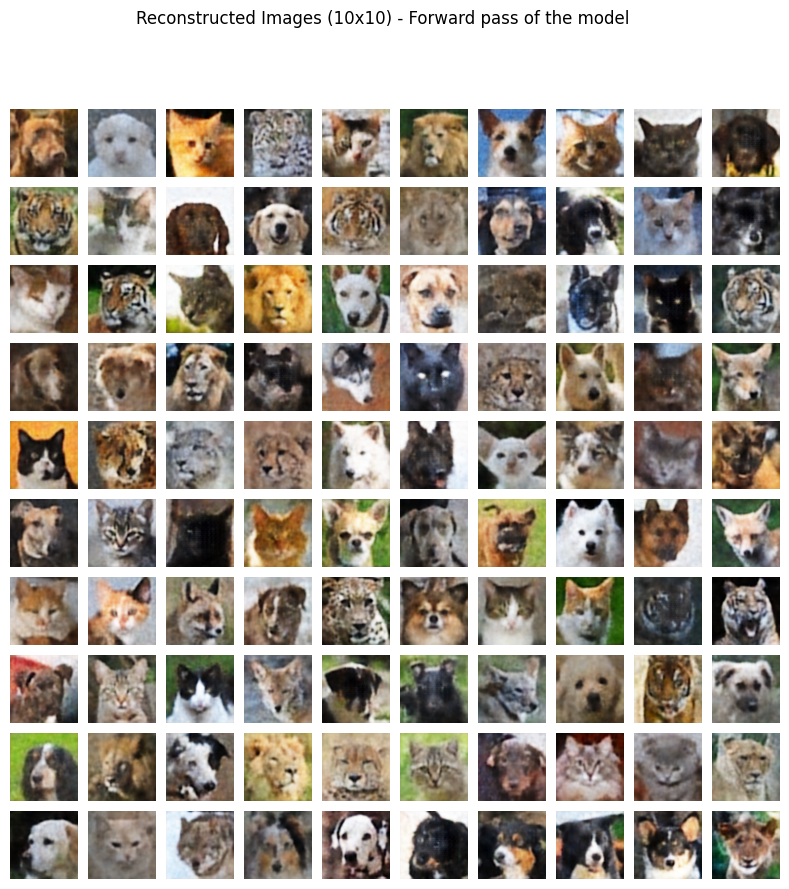

In [ ]:
model = VAE(Encoder_sel=2 ,Decoder_sel=2, input_dim = 3*128*128, hidden_dim_1 = 2048, hidden_dim_2 = 512, latent_dim = 256, device=device).to(device)
optimizer = Adam(model.parameters(), lr=1e-4)
Reconst_loss_list,KLD_loss_list = train(model, optimizer, epochs=100, device=device, loss_type = 'MSE', reduction_type = 'sum', num_z = 1, beta = 0)

### Reconstructed images from the Auto-encoder

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

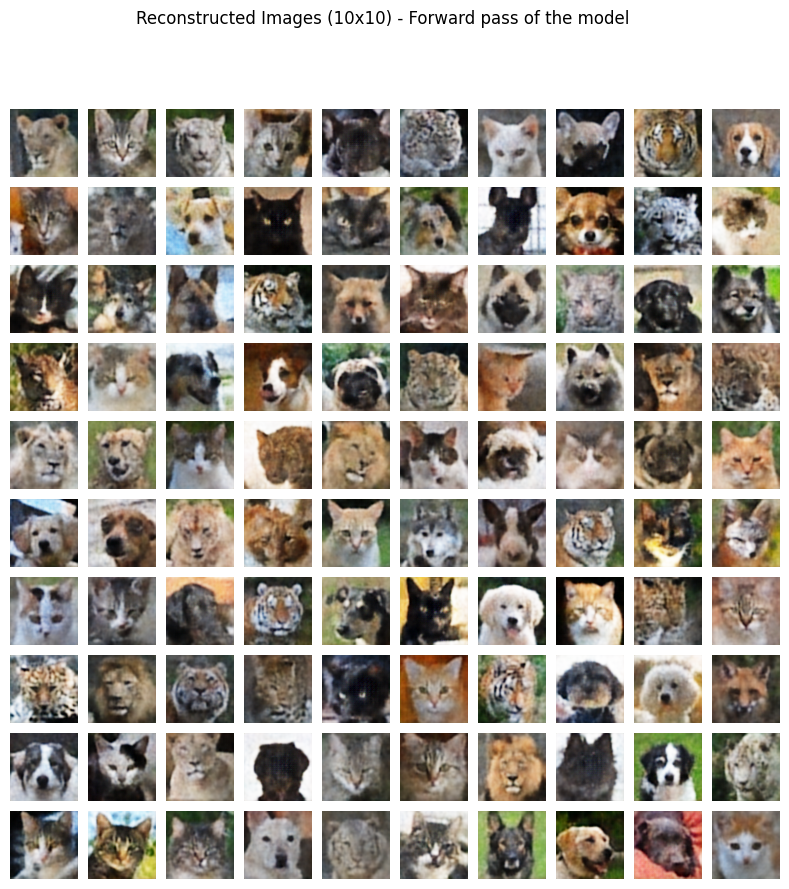

In [ ]:
image,_ = next(iter(train_loader))
plot_grid(model,latent_dim = 256, num_samples = 100, x = image, plot_reconstruction = True, num_z = 1)

# Classifier Guided Diffusion model

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets
import matplotlib.pyplot as plt
import numpy as np
import torchvision.utils as vutils
import random
import torchvision
import torchvision.transforms as transforms
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.autograd import Variable
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import math
import imageio
from argparse import ArgumentParser

%matplotlib inline

torch.autograd.set_detect_anomaly(True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Set the parameters

In [ ]:
# Setting reproducibility
SEED = 0
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

batch_size = 100
n_epochs = 200
lr = 0.001

### Classifier-guided diffusion model

- The latent embeddings from Auto-encoders are provided as inputs to the u-net and separately a classifier is defined to output $p(y|x_{t})$
- U-net
    - Input: Noisy image: $z_{t}$, Time embedding: t, Class embedding: y
    - Output: Estimated score function: $S_{\theta}$
- Classifier:
    - Input: Noisy image: $z_{t}$
    - Output:  $p(y|z_{t})$ <br><br>
    
- Losses (with score function):
    - u-net:    $||S_{\theta}-\nabla_{z_{t}}logp(z_{t})||_{2}^{2}+\nabla_{z_{t}}logp(y|z_{t})$
    - Classifier:    $\nabla_{z_{t}}logp(y|z_{t})$ <br><br>

Note: Output with score-based diffusion model were not clean, so we reverted back to the general $\epsilon_{\theta}$ based estimation <br>
Losses used were: $||\epsilon_{\theta}-\epsilon||_{2}^{2}+\nabla_{z_{t}}logp(y|z_{t})$ and $\nabla_{z_{t}}logp(y|z_{t})$ for u-net and Classifier respectively <br><br>


- Classes:
    - MyDDPM:
        - Forward pass: Encodes the noisy latent vectors from latent embeddings of the Auto-Encoder
        - Backward pass: Runs a forward pass of the u-net to estimate the noise added or the score function from $z_{0}$ to $z_{t}$
    - MyUnet:
        - Forward pass:
            - Time and class embeddings: For time embedding, sinusoidal embedding is used
            - Conversion from linear 256 dim latent vector to a 20 channel image
            - Pass the latent vector and embeddings (Time and class) through down channel layers of u-net
                - Each down channel is implemented as a MyBlock which does the following:
                    - Uses two convolution layers
                    - In-between the two convolution layers, it adds the time and class embedding to the latent image and passes through activation layers
                    - Then it does a down sizing of the image and calls next instantiation of down layer
            - Pass the resulting image through the middle/bottom blocks of u-net
            - Pass the resulting image through the Up Blocks which do an inverse operation of Down blocks
                - Note that here skip connections from the corresponding Down blocks are also appended to the image and then Up conversion is done
            - Provide the resulting estimated $\epsilon_{\theta}$ or Estimated score Function
    - SinusoidalPositionEmbeddings:
        - Performs the standard sinusoidal embedding
    - MyBlock:
        - Is called inside the u-net to realize each layer of down or up conversion of the image
    - ClassConditioning:
        - Defines linear layers for Class embeddings



In [ ]:
class MyDDPM(nn.Module):
    def __init__(self, network, n_steps=1000, min_beta=10 ** -4, max_beta=0.02, device=None, image_chw=(1, 16, 16)):
        super(MyDDPM, self).__init__()
        self.n_steps = n_steps
        self.device = device
        self.image_chw = image_chw
        self.network = network.to(device)
        self.betas = torch.linspace(min_beta, max_beta, n_steps).to(device)
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.tensor([torch.prod(self.alphas[:i + 1]) for i in range(len(self.alphas))]).to(device)

    def forward(self, x0, t, eta=None):
        # Directly obtain the noisy image (noise latent vector) from the embedded vector
        n, c = x0.shape
        a_bar = self.alpha_bars[t]

        if eta is None:
            eta = torch.randn(n, c).to(self.device)

        noisy = a_bar.sqrt().reshape(n, 1) * x0 + (1 - a_bar).sqrt().reshape(n, 1) * eta

        # Calculate the true score function
        a = a_bar.sqrt().reshape(n, 1) * x0 - noisy
        b = (1 - a_bar).reshape(n, 1)

        true_score = a/b
        return noisy, true_score

    def backward(self, x, cl, t):
        # Run a forward pass of u-net to get the estimated value of noise added or the score function
        return self.network(x, cl, t)



class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self,dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device = device)* -embeddings)
        embeddings = time[:,None]*embeddings[None,:]
        embeddings = torch.cat((embeddings.sin(),embeddings.cos()),dim=-1)
        return embeddings


class MyBlock(nn.Module):
    def __init__(self, in_c, out_c, time_emb_dim=16,up = False):
        super().__init__()

        self.time_mlp = nn.Linear(time_emb_dim,out_c)
        self.class_mlp = nn.Linear(time_emb_dim,out_c)
        if up:
            self.conv1 = nn.Conv2d(2*in_c,out_c,3,padding=1)
            self.transform = nn.ConvTranspose2d(out_c,out_c,4,2,1)
        else:
            self.conv1 = nn.Conv2d(in_c,out_c,3,padding=1)
            self.transform = nn.Conv2d(out_c,out_c,4,2,1)
        self.conv2 = nn.Conv2d(out_c,out_c,3,padding=1)
        self.pool = nn.MaxPool2d(3,stride=2)
        self.bnorm = nn.BatchNorm2d(out_c)
        self.relu = nn.GELU()

    def forward(self, x,cl, t):
        # First Conv
        h = self.bnorm(self.relu(self.conv1(x)))

        # Time Embedding
        a = self.time_mlp(t)
        a = a.squeeze()
        b = self.class_mlp(cl)

        time_emb = self.relu(a + b)
        time_emb = time_emb.squeeze()

        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, )*2]

        # Add time and label embedded data
        h = h + time_emb

        # Second Conv
        h = self.bnorm(self.relu(self.conv2(h)))

        # Down or Upsample
        return self.transform(h)


class MyUNet(nn.Module):
    def __init__(self, n_steps=1000, time_emb_dim = 16):
        super().__init__()
        image_channels = 1
        down_channels = (20,40,80,160)
        up_channels = (160,80,40,20)

        out_dim = 1

        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim,time_emb_dim),
            nn.ReLU()
        )

        self.cls_mlp = nn.Sequential(
            nn.Linear(3,time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim,time_emb_dim),
            nn.ReLU()
        )


        self.conv0 = nn.Sequential(
            nn.Linear(256,1*64*64),
            nn.ReLU(),
            nn.Unflatten(1,(1,64,64)),
            nn.Conv2d(image_channels,down_channels[0],kernel_size=3,padding=1)
        )

        self.downs = nn.ModuleList([MyBlock(down_channels[i],down_channels[i+1],time_emb_dim) for i in range(len(down_channels) - 1)])

        self.middle = nn.Sequential(
                nn.Conv2d(160,80,3,padding=1),
                nn.BatchNorm2d(80),
                nn.GELU(),
                nn.Conv2d(80,80,3,padding=1),
                nn.BatchNorm2d(80),
                nn.GELU(),
                nn.Conv2d(80,160,3,padding=1),
                nn.BatchNorm2d(160)
            )


        self.ups = nn.ModuleList([MyBlock(up_channels[i],up_channels[i+1],time_emb_dim,up=True) for i in range(len(up_channels) - 1)])

        self.output = nn.Sequential(
            nn.Conv2d(up_channels[-1],1,out_dim),
            nn.Flatten(start_dim=1,end_dim=3),
            nn.Linear(1*64*64,256)
        )

    def forward(self,x,cl,timestep):
        # Embedding of time steps
        t = self.time_mlp(timestep)

        # Linear layers used instead of embedding for class labels. Converts to the same dimension as time-step embedding
        cl = cl.to(device)
        cl = cl.to(torch.float)
        cl = self.cls_mlp(cl)

        # Perform conversion of the latent vector to 3D tensor for Down networks
        x = self.conv0(x)

        # Create a list of intermediate values in Down layers of u-net
        residual_inputs = []
        for down in self.downs:
            x = down(x,cl,t)
            residual_inputs.append(x)

        x = self.middle(x)

        # Define up layers of u-net by using skip connections with corresponding down layer. Skip connections are concatenated with the input
        for up in self.ups:
            residual_x = residual_inputs.pop()
            x = torch.cat((x,residual_x), dim = 1)
            x = up(x,cl,t)
        return self.output(x)


class ClassConditioning(nn.Module):
    def __init__(self, res, num_channels=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Linear(10,res * res * num_channels),
            nn.SiLU()
        )
        self.res = res
        self.num_ch = num_channels

    def forward(self, x):
        c = self.block(x)
        c = c.view((-1,self.num_ch,self.res,self.res))
        return c

### Classifier

- Classifies the noisy image $(z_{t})$ to give $p(y|z_{t})$
- CNN implemented to convert the latent vector (256 dim) to a softmax output (3 dim)

In [ ]:
class Classifier(nn.Module):
    """
    Classifier Network for the classifier-guided diffusion
    """
    def __init__(self, n_gpu):
        super(Classifier, self).__init__()
        self.n_gpu = n_gpu
        self.seq = nn.Sequential(

            nn.Linear(256, 256*2*2),
            nn.LeakyReLU(0.2),
            nn.Linear(256*2*2, 256*4*4),
            nn.LeakyReLU(0.2),
            nn.Linear(256*4*4, 256*8*8),
            nn.LeakyReLU(0.2),
            nn.Unflatten(1,(256,8,8)),
            # input is 256*8*8
            nn.Conv2d(64*4, 64*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64*2),
            nn.ReLU(True),
            # input is 128*4*4
            nn.Conv2d( 64*2, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # input is 64*2*2
            nn.Conv2d( 64, 3, 4, 2, 1, bias=False),
            nn.BatchNorm2d(3),
            nn.ReLU(True),
            # input is 3*1*1
            nn.Flatten(start_dim=1,end_dim=3),
            nn.Softmax()

        )

    def forward(self, input):
        return self.seq(input)

### Plotting and generating images functions

- show_images() : Plots a 10x10 figure of the generated images
- generate_new_images() :
    - Generates latent embeddings/vectors from noisy versions of it through backward process of DDPM
    - Pass this generated latent vector through the decoder of the VAE to generate the images <br>
    Note: Score function based generation was tried but it didnt generate proper images

In [ ]:
def show_images(images, title=""):
    """Plots a 10x10 figure of the generated images"""

    if type(images) is torch.Tensor:
        images = images.detach().cpu()

    fig = plt.figure(figsize=(10, 10))
    rows = 10
    cols = 10

    idx = 0
    for r in range(rows):
        for c in range(cols):
            fig.add_subplot(rows, cols, idx + 1)

            if idx < len(images):
                plt.imshow(images[idx].permute(1,2,0))
                plt.axis('off')
                idx += 1
    fig.suptitle(title, fontsize=30)

    plt.show()


def generate_new_images(ddpm, n_samples=10, clss = 0, device=None):
    """Generates the latent z from noisy images through """

    with torch.no_grad():
        if device is None:
            device = ddpm.device

        # Starting from random noise
        x = torch.randn(n_samples,256).to(device)
        cl3 = torch.full((n_samples,1),clss)
        cl2 = F.one_hot(cl3, num_classes=3)
        cl2 = cl2.to(torch.float32)
        cl2 = cl2.squeeze()

        for idx, t in enumerate(list(range(ddpm.n_steps))[::-1]):
            # Estimating noise to be removed
            time_tensor = (torch.ones(n_samples, 1) * t).to(device).long()
            eta_theta = ddpm.backward(x,cl2,time_tensor)

            alpha_t = ddpm.alphas[t]
            alpha_t_bar = ddpm.alpha_bars[t]

            # Partially denoising the image
            x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

            # Option for using score based estimates for backward process. However generated images were poor
            #x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t)* est_scr)


            if t > 0:
                z = torch.randn(n_samples, 256).to(device)

                beta_t = ddpm.betas[t]
                sigma_t = beta_t.sqrt()

                x = x + sigma_t * z


    x = x.view((-1,256))
    # Pass the latent vector obtained through the decoder of VAE to get true images
    return model.decoder(x)

### Instantiate the Classifier Guided Diffusion model

- Components: u-net, Classifier

In [ ]:
# Defining model
n_steps, min_beta, max_beta = 500, 10 ** -4, 0.02
ddpm = MyDDPM(MyUNet(n_steps, time_emb_dim=40), n_steps=n_steps, min_beta=min_beta, max_beta=max_beta, device=device)
cls = Classifier(n_gpu=1)
cls = cls.to(device)

### Training for Classifier Guided Diffusion

In [ ]:
def training_loop(ddpm, loader, n_epochs, optim,optim_cls, device, display=False, store_path="ddpm_model.pt"):
    DDPM_mse = nn.MSELoss()
    Classifier_mse = nn.MSELoss()
    best_loss = float("inf")
    n_steps = ddpm.n_steps

    #for epoch in tqdm(range(n_epochs), desc=f"Training progress", colour="#00ff00"):
    for epoch in range(n_epochs):
        epoch_loss = 0.0
        for step, (img,labels) in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch + 1}/{n_epochs}", colour="GREEN"):
            # Loading data
            img = img.to(device)

            mean, log_var = model.encode(img)
            z = model.reparameterization(mean, torch.exp(0.5 * log_var))

            n = len(z)


            # Picking some noise for each of the images in the batch, a timestep and the respective alpha_bars
            eta = torch.randn_like(z).to(device)
            t = torch.randint(0, n_steps, (n,)).to(device)

            # Computing the noisy image based on x0 and the time-step (forward process)
            noisy_imgs, tr_score = ddpm(z, t, eta)


            labels = labels.to(device)
            lbl = F.one_hot(labels, num_classes=3)
            lbl = lbl.to(torch.float32)


            # Getting model estimation of noise based on the images and the time-step
            eta_theta = ddpm.backward(noisy_imgs, lbl, t.reshape(n, -1))

            loss_cls = Classifier_mse(cls(noisy_imgs),lbl)

            optim_cls.zero_grad()
            loss_cls.backward(retain_graph=True)
            optim_cls.step()

            loss_DDPM = DDPM_mse(eta_theta, eta)
            loss = loss_DDPM + Classifier_mse(cls(noisy_imgs),lbl)

            # Optimizing the MSE between the noise plugged and the predicted noise
            optim.zero_grad()
            loss.backward()
            optim.step()

            epoch_loss += loss.item() * len(z) / len(loader.dataset)

        # Display images generated at this epoch
        if (epoch + 1) % 10 == 0:
            show_images(generate_new_images(ddpm, device=device), f"Images generated at epoch {epoch + 1}")

        log_string = f"Loss at epoch {epoch + 1}: {epoch_loss:.4f}, Classifier loss: {loss_cls:.4f}, Loss DDPM: {loss_DDPM:.4f}"

        # Storing the model
        if best_loss > epoch_loss:
            best_loss = epoch_loss
            torch.save(ddpm.state_dict(), store_path)
            # log_string += " --> Best model ever (stored)"

        print(log_string)

### Run the training

Epoch 1/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 1: 0.4628, Classifier loss: 0.1600, Loss DDPM: 0.2692


Epoch 2/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 2: 0.4101, Classifier loss: 0.1792, Loss DDPM: 0.2364


Epoch 3/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 3: 0.3905, Classifier loss: 0.1928, Loss DDPM: 0.1661


Epoch 4/200: 100%|██████████| 147/147 [00:26<00:00,  5.60it/s]


Loss at epoch 4: 0.3854, Classifier loss: 0.1343, Loss DDPM: 0.2185


Epoch 5/200: 100%|██████████| 147/147 [00:26<00:00,  5.59it/s]


Loss at epoch 5: 0.3746, Classifier loss: 0.1322, Loss DDPM: 0.1862


Epoch 6/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 6: 0.3713, Classifier loss: 0.1466, Loss DDPM: 0.1948


Epoch 7/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 7: 0.3662, Classifier loss: 0.1714, Loss DDPM: 0.2754


Epoch 8/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 8: 0.3635, Classifier loss: 0.1775, Loss DDPM: 0.2326


Epoch 9/200: 100%|██████████| 147/147 [00:26<00:00,  5.48it/s]


Loss at epoch 9: 0.3617, Classifier loss: 0.1191, Loss DDPM: 0.1860


Epoch 10/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with R

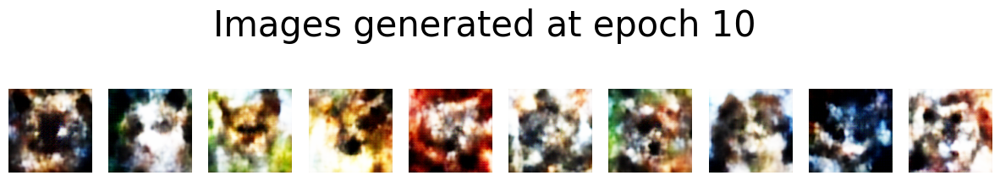

Loss at epoch 10: 0.3531, Classifier loss: 0.1109, Loss DDPM: 0.2258


Epoch 11/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 11: 0.3561, Classifier loss: 0.1516, Loss DDPM: 0.2545


Epoch 12/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 12: 0.3506, Classifier loss: 0.1376, Loss DDPM: 0.2062


Epoch 13/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 13: 0.3517, Classifier loss: 0.1569, Loss DDPM: 0.2038


Epoch 14/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 14: 0.3474, Classifier loss: 0.1332, Loss DDPM: 0.2221


Epoch 15/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 15: 0.3467, Classifier loss: 0.1611, Loss DDPM: 0.1904


Epoch 16/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 16: 0.3449, Classifier loss: 0.1593, Loss DDPM: 0.2298


Epoch 17/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 17: 0.3419, Classifier loss: 0.1225, Loss DDPM: 0.2493


Epoch 18/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 18: 0.3393, Classifier loss: 0.1454, Loss DDPM: 0.1673


Epoch 19/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 19: 0.3431, Classifier loss: 0.1448, Loss DDPM: 0.2480


Epoch 20/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with R

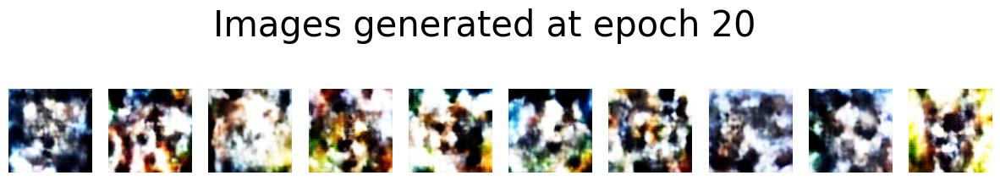

Loss at epoch 20: 0.3362, Classifier loss: 0.1909, Loss DDPM: 0.2197


Epoch 21/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 21: 0.3367, Classifier loss: 0.1404, Loss DDPM: 0.2485


Epoch 22/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 22: 0.3372, Classifier loss: 0.1280, Loss DDPM: 0.1553


Epoch 23/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 23: 0.3367, Classifier loss: 0.1564, Loss DDPM: 0.1802


Epoch 24/200: 100%|██████████| 147/147 [00:26<00:00,  5.59it/s]


Loss at epoch 24: 0.3348, Classifier loss: 0.1178, Loss DDPM: 0.1671


Epoch 25/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 25: 0.3316, Classifier loss: 0.1444, Loss DDPM: 0.1463


Epoch 26/200: 100%|██████████| 147/147 [00:26<00:00,  5.59it/s]


Loss at epoch 26: 0.3311, Classifier loss: 0.1279, Loss DDPM: 0.1885


Epoch 27/200: 100%|██████████| 147/147 [00:26<00:00,  5.59it/s]


Loss at epoch 27: 0.3285, Classifier loss: 0.1087, Loss DDPM: 0.2099


Epoch 28/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 28: 0.3275, Classifier loss: 0.1306, Loss DDPM: 0.2418


Epoch 29/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 29: 0.3264, Classifier loss: 0.1188, Loss DDPM: 0.2456


Epoch 30/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with R

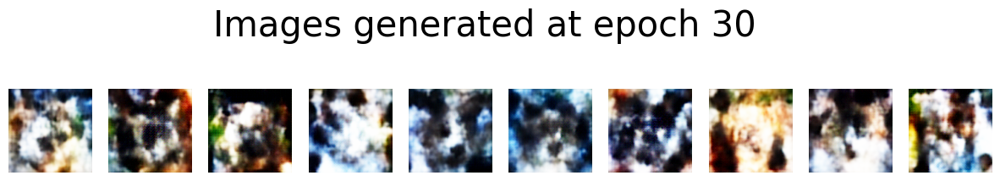

Loss at epoch 30: 0.3286, Classifier loss: 0.1179, Loss DDPM: 0.2128


Epoch 31/200: 100%|██████████| 147/147 [00:26<00:00,  5.50it/s]


Loss at epoch 31: 0.3241, Classifier loss: 0.1424, Loss DDPM: 0.1812


Epoch 32/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 32: 0.3288, Classifier loss: 0.1567, Loss DDPM: 0.1681


Epoch 33/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 33: 0.3297, Classifier loss: 0.1118, Loss DDPM: 0.1631


Epoch 34/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 34: 0.3253, Classifier loss: 0.1074, Loss DDPM: 0.2314


Epoch 35/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 35: 0.3255, Classifier loss: 0.1405, Loss DDPM: 0.1455


Epoch 36/200: 100%|██████████| 147/147 [00:26<00:00,  5.59it/s]


Loss at epoch 36: 0.3221, Classifier loss: 0.1612, Loss DDPM: 0.1904


Epoch 37/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 37: 0.3211, Classifier loss: 0.1460, Loss DDPM: 0.1871


Epoch 38/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]


Loss at epoch 38: 0.3239, Classifier loss: 0.0876, Loss DDPM: 0.2079


Epoch 39/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 39: 0.3214, Classifier loss: 0.1386, Loss DDPM: 0.1785


Epoch 40/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with R

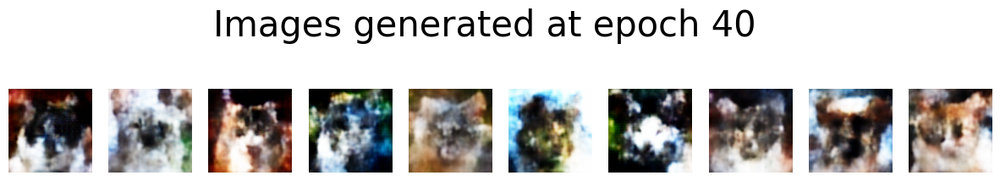

Loss at epoch 40: 0.3183, Classifier loss: 0.1615, Loss DDPM: 0.2243


Epoch 41/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 41: 0.3239, Classifier loss: 0.1245, Loss DDPM: 0.1964


Epoch 42/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 42: 0.3201, Classifier loss: 0.1534, Loss DDPM: 0.1678


Epoch 43/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 43: 0.3213, Classifier loss: 0.1593, Loss DDPM: 0.2163


Epoch 44/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 44: 0.3162, Classifier loss: 0.1191, Loss DDPM: 0.1424


Epoch 45/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 45: 0.3182, Classifier loss: 0.1757, Loss DDPM: 0.1190


Epoch 46/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 46: 0.3187, Classifier loss: 0.1405, Loss DDPM: 0.2091


Epoch 47/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 47: 0.3198, Classifier loss: 0.1050, Loss DDPM: 0.2024


Epoch 48/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 48: 0.3156, Classifier loss: 0.1107, Loss DDPM: 0.1911


Epoch 49/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 49: 0.3195, Classifier loss: 0.1047, Loss DDPM: 0.1357


Epoch 50/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


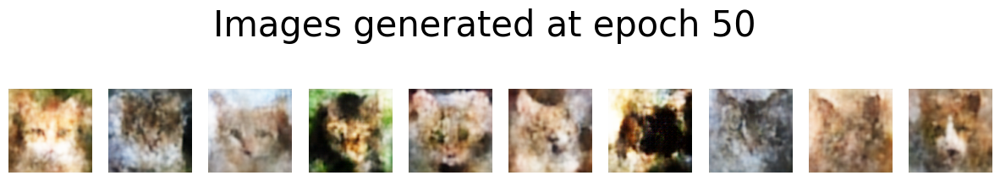

Loss at epoch 50: 0.3177, Classifier loss: 0.1206, Loss DDPM: 0.2032


Epoch 51/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 51: 0.3133, Classifier loss: 0.1490, Loss DDPM: 0.1849


Epoch 52/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 52: 0.3144, Classifier loss: 0.1788, Loss DDPM: 0.1714


Epoch 53/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 53: 0.3126, Classifier loss: 0.1089, Loss DDPM: 0.1902


Epoch 54/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 54: 0.3146, Classifier loss: 0.1049, Loss DDPM: 0.1928


Epoch 55/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 55: 0.3155, Classifier loss: 0.1353, Loss DDPM: 0.1856


Epoch 56/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 56: 0.3171, Classifier loss: 0.0919, Loss DDPM: 0.2418


Epoch 57/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 57: 0.3123, Classifier loss: 0.0915, Loss DDPM: 0.1877


Epoch 58/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 58: 0.3110, Classifier loss: 0.1109, Loss DDPM: 0.1622


Epoch 59/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 59: 0.3130, Classifier loss: 0.0974, Loss DDPM: 0.2208


Epoch 60/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


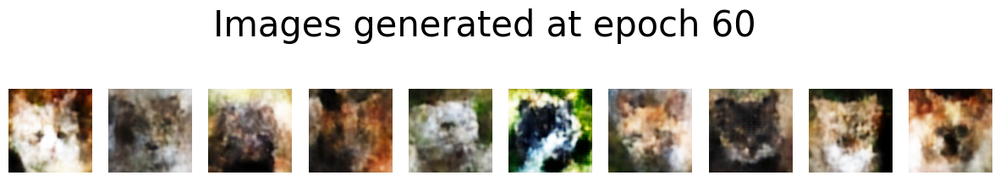

Loss at epoch 60: 0.3135, Classifier loss: 0.1183, Loss DDPM: 0.2057


Epoch 61/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 61: 0.3126, Classifier loss: 0.1113, Loss DDPM: 0.1972


Epoch 62/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 62: 0.3104, Classifier loss: 0.1541, Loss DDPM: 0.1385


Epoch 63/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 63: 0.3122, Classifier loss: 0.1648, Loss DDPM: 0.1801


Epoch 64/200: 100%|██████████| 147/147 [00:26<00:00,  5.50it/s]


Loss at epoch 64: 0.3113, Classifier loss: 0.1348, Loss DDPM: 0.2041


Epoch 65/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 65: 0.3091, Classifier loss: 0.1510, Loss DDPM: 0.1753


Epoch 66/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 66: 0.3104, Classifier loss: 0.1153, Loss DDPM: 0.2159


Epoch 67/200: 100%|██████████| 147/147 [00:26<00:00,  5.49it/s]


Loss at epoch 67: 0.3088, Classifier loss: 0.1143, Loss DDPM: 0.2048


Epoch 68/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 68: 0.3082, Classifier loss: 0.1106, Loss DDPM: 0.1782


Epoch 69/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 69: 0.3117, Classifier loss: 0.2327, Loss DDPM: 0.1386


Epoch 70/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


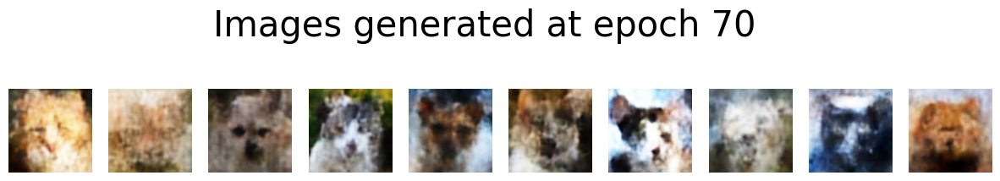

Loss at epoch 70: 0.3095, Classifier loss: 0.1277, Loss DDPM: 0.1693


Epoch 71/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 71: 0.3089, Classifier loss: 0.1359, Loss DDPM: 0.1636


Epoch 72/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 72: 0.3079, Classifier loss: 0.1514, Loss DDPM: 0.1468


Epoch 73/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 73: 0.3090, Classifier loss: 0.0979, Loss DDPM: 0.2163


Epoch 74/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 74: 0.3088, Classifier loss: 0.1525, Loss DDPM: 0.1880


Epoch 75/200: 100%|██████████| 147/147 [00:26<00:00,  5.49it/s]


Loss at epoch 75: 0.3084, Classifier loss: 0.1472, Loss DDPM: 0.1427


Epoch 76/200: 100%|██████████| 147/147 [00:26<00:00,  5.49it/s]


Loss at epoch 76: 0.3052, Classifier loss: 0.1247, Loss DDPM: 0.1506


Epoch 77/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 77: 0.3070, Classifier loss: 0.1010, Loss DDPM: 0.2385


Epoch 78/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 78: 0.3065, Classifier loss: 0.1516, Loss DDPM: 0.1948


Epoch 79/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 79: 0.3047, Classifier loss: 0.1312, Loss DDPM: 0.2471


Epoch 80/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


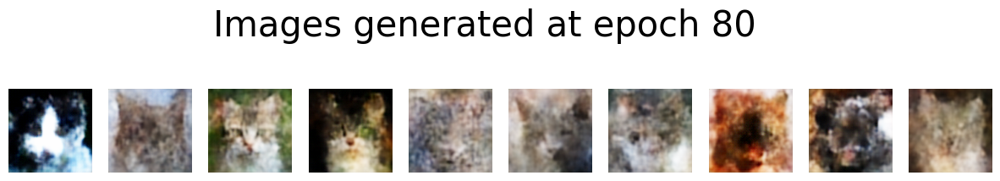

Loss at epoch 80: 0.3042, Classifier loss: 0.1849, Loss DDPM: 0.1702


Epoch 81/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 81: 0.3059, Classifier loss: 0.1422, Loss DDPM: 0.1492


Epoch 82/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 82: 0.3039, Classifier loss: 0.0603, Loss DDPM: 0.2168


Epoch 83/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]


Loss at epoch 83: 0.3031, Classifier loss: 0.1021, Loss DDPM: 0.1751


Epoch 84/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 84: 0.3053, Classifier loss: 0.1592, Loss DDPM: 0.1602


Epoch 85/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 85: 0.3055, Classifier loss: 0.0975, Loss DDPM: 0.1728


Epoch 86/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 86: 0.3049, Classifier loss: 0.1577, Loss DDPM: 0.1929


Epoch 87/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]


Loss at epoch 87: 0.3015, Classifier loss: 0.1687, Loss DDPM: 0.2288


Epoch 88/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 88: 0.3031, Classifier loss: 0.1556, Loss DDPM: 0.2027


Epoch 89/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]


Loss at epoch 89: 0.3040, Classifier loss: 0.1273, Loss DDPM: 0.1650


Epoch 90/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


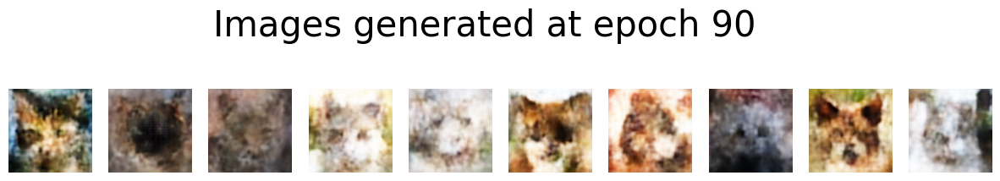

Loss at epoch 90: 0.3025, Classifier loss: 0.1357, Loss DDPM: 0.1667


Epoch 91/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 91: 0.3037, Classifier loss: 0.0733, Loss DDPM: 0.2322


Epoch 92/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 92: 0.3036, Classifier loss: 0.1752, Loss DDPM: 0.1506


Epoch 93/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]


Loss at epoch 93: 0.3041, Classifier loss: 0.1262, Loss DDPM: 0.1435


Epoch 94/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 94: 0.3022, Classifier loss: 0.1169, Loss DDPM: 0.2130


Epoch 95/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 95: 0.3018, Classifier loss: 0.1328, Loss DDPM: 0.2068


Epoch 96/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 96: 0.3021, Classifier loss: 0.1218, Loss DDPM: 0.1554


Epoch 97/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]


Loss at epoch 97: 0.3013, Classifier loss: 0.1090, Loss DDPM: 0.2322


Epoch 98/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 98: 0.3009, Classifier loss: 0.1583, Loss DDPM: 0.1703


Epoch 99/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 99: 0.2995, Classifier loss: 0.1394, Loss DDPM: 0.1575


Epoch 100/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


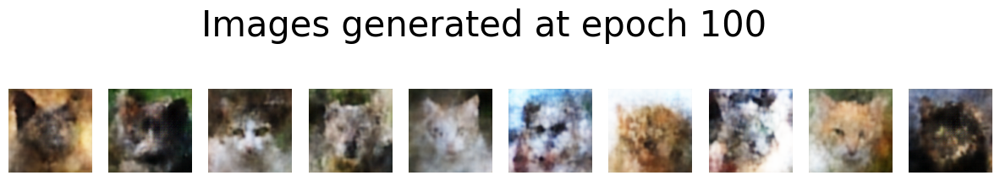

Loss at epoch 100: 0.3015, Classifier loss: 0.0899, Loss DDPM: 0.2037


Epoch 101/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 101: 0.3004, Classifier loss: 0.1281, Loss DDPM: 0.1388


Epoch 102/200: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s]


Loss at epoch 102: 0.3014, Classifier loss: 0.0832, Loss DDPM: 0.2542


Epoch 103/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 103: 0.3004, Classifier loss: 0.1573, Loss DDPM: 0.1869


Epoch 104/200: 100%|██████████| 147/147 [00:26<00:00,  5.54it/s]


Loss at epoch 104: 0.2995, Classifier loss: 0.1390, Loss DDPM: 0.2254


Epoch 105/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 105: 0.3011, Classifier loss: 0.1312, Loss DDPM: 0.1761


Epoch 106/200: 100%|██████████| 147/147 [00:26<00:00,  5.60it/s]


Loss at epoch 106: 0.2995, Classifier loss: 0.1096, Loss DDPM: 0.1727


Epoch 107/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 107: 0.3007, Classifier loss: 0.1355, Loss DDPM: 0.1577


Epoch 108/200: 100%|██████████| 147/147 [00:26<00:00,  5.55it/s]


Loss at epoch 108: 0.2990, Classifier loss: 0.1335, Loss DDPM: 0.1962


Epoch 109/200: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s]


Loss at epoch 109: 0.2998, Classifier loss: 0.1162, Loss DDPM: 0.1484


Epoch 110/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


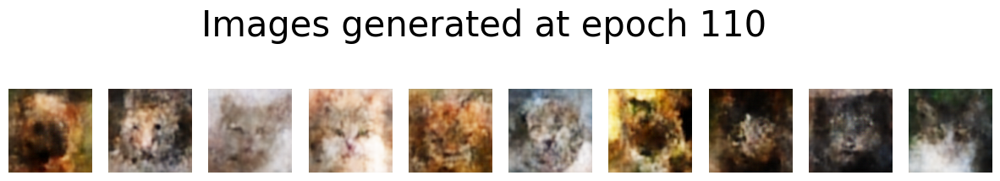

Loss at epoch 110: 0.2997, Classifier loss: 0.1002, Loss DDPM: 0.1838


Epoch 111/200: 100%|██████████| 147/147 [00:26<00:00,  5.52it/s]


Loss at epoch 111: 0.3004, Classifier loss: 0.1427, Loss DDPM: 0.1233


Epoch 112/200: 100%|██████████| 147/147 [00:26<00:00,  5.49it/s]


Loss at epoch 112: 0.3018, Classifier loss: 0.1639, Loss DDPM: 0.1759


Epoch 113/200: 100%|██████████| 147/147 [00:26<00:00,  5.48it/s]


Loss at epoch 113: 0.3003, Classifier loss: 0.1519, Loss DDPM: 0.1827


Epoch 114/200: 100%|██████████| 147/147 [00:27<00:00,  5.43it/s]


Loss at epoch 114: 0.2975, Classifier loss: 0.1549, Loss DDPM: 0.1418


Epoch 115/200: 100%|██████████| 147/147 [00:26<00:00,  5.47it/s]


Loss at epoch 115: 0.2975, Classifier loss: 0.1099, Loss DDPM: 0.1998


Epoch 116/200: 100%|██████████| 147/147 [00:26<00:00,  5.50it/s]


Loss at epoch 116: 0.2975, Classifier loss: 0.1453, Loss DDPM: 0.1712


Epoch 117/200: 100%|██████████| 147/147 [00:26<00:00,  5.51it/s]


Loss at epoch 117: 0.2973, Classifier loss: 0.1182, Loss DDPM: 0.1935


Epoch 118/200: 100%|██████████| 147/147 [00:26<00:00,  5.49it/s]


Loss at epoch 118: 0.2987, Classifier loss: 0.1507, Loss DDPM: 0.2011


Epoch 119/200: 100%|██████████| 147/147 [00:26<00:00,  5.45it/s]


Loss at epoch 119: 0.2974, Classifier loss: 0.0812, Loss DDPM: 0.1968


Epoch 120/200: 100%|██████████| 147/147 [00:26<00:00,  5.46it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


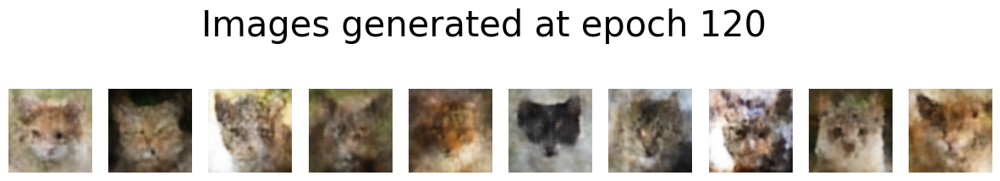

Loss at epoch 120: 0.2966, Classifier loss: 0.1221, Loss DDPM: 0.1582


Epoch 121/200: 100%|██████████| 147/147 [00:26<00:00,  5.46it/s]


Loss at epoch 121: 0.2965, Classifier loss: 0.1197, Loss DDPM: 0.1879


Epoch 122/200: 100%|██████████| 147/147 [00:26<00:00,  5.47it/s]


Loss at epoch 122: 0.2977, Classifier loss: 0.0895, Loss DDPM: 0.2046


Epoch 123/200: 100%|██████████| 147/147 [00:26<00:00,  5.46it/s]


Loss at epoch 123: 0.2963, Classifier loss: 0.1249, Loss DDPM: 0.1767


Epoch 124/200: 100%|██████████| 147/147 [00:27<00:00,  5.39it/s]


Loss at epoch 124: 0.3001, Classifier loss: 0.1154, Loss DDPM: 0.1863


Epoch 125/200: 100%|██████████| 147/147 [00:27<00:00,  5.43it/s]


Loss at epoch 125: 0.2977, Classifier loss: 0.1071, Loss DDPM: 0.2257


Epoch 126/200: 100%|██████████| 147/147 [00:26<00:00,  5.49it/s]


Loss at epoch 126: 0.2973, Classifier loss: 0.1038, Loss DDPM: 0.1765


Epoch 127/200: 100%|██████████| 147/147 [00:26<00:00,  5.48it/s]


Loss at epoch 127: 0.2957, Classifier loss: 0.0970, Loss DDPM: 0.2263


Epoch 128/200: 100%|██████████| 147/147 [00:27<00:00,  5.44it/s]


Loss at epoch 128: 0.2948, Classifier loss: 0.1170, Loss DDPM: 0.2050


Epoch 129/200: 100%|██████████| 147/147 [00:26<00:00,  5.48it/s]


Loss at epoch 129: 0.2978, Classifier loss: 0.0717, Loss DDPM: 0.2540


Epoch 130/200: 100%|██████████| 147/147 [00:27<00:00,  5.37it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


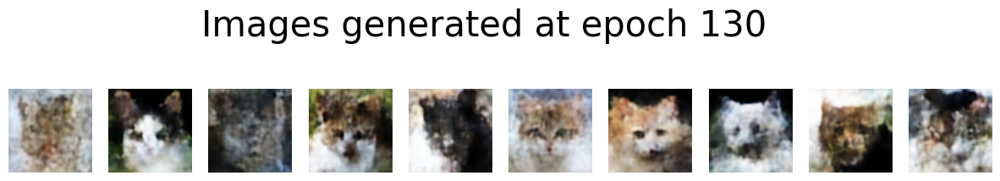

Loss at epoch 130: 0.2942, Classifier loss: 0.0932, Loss DDPM: 0.2335


Epoch 131/200: 100%|██████████| 147/147 [00:26<00:00,  5.47it/s]


Loss at epoch 131: 0.2953, Classifier loss: 0.1111, Loss DDPM: 0.1849


Epoch 132/200: 100%|██████████| 147/147 [00:26<00:00,  5.46it/s]


Loss at epoch 132: 0.2935, Classifier loss: 0.1223, Loss DDPM: 0.1599


Epoch 133/200: 100%|██████████| 147/147 [00:26<00:00,  5.46it/s]


Loss at epoch 133: 0.2941, Classifier loss: 0.1426, Loss DDPM: 0.1948


Epoch 134/200: 100%|██████████| 147/147 [00:26<00:00,  5.48it/s]


Loss at epoch 134: 0.2961, Classifier loss: 0.1310, Loss DDPM: 0.2088


Epoch 135/200: 100%|██████████| 147/147 [00:26<00:00,  5.50it/s]


Loss at epoch 135: 0.2944, Classifier loss: 0.1071, Loss DDPM: 0.2364


Epoch 136/200: 100%|██████████| 147/147 [00:26<00:00,  5.57it/s]


Loss at epoch 136: 0.2932, Classifier loss: 0.1061, Loss DDPM: 0.2001


Epoch 137/200: 100%|██████████| 147/147 [00:27<00:00,  5.37it/s]


Loss at epoch 137: 0.2935, Classifier loss: 0.1315, Loss DDPM: 0.1762


Epoch 138/200: 100%|██████████| 147/147 [00:27<00:00,  5.33it/s]


Loss at epoch 138: 0.2943, Classifier loss: 0.0938, Loss DDPM: 0.1795


Epoch 139/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 139: 0.2945, Classifier loss: 0.1059, Loss DDPM: 0.1812


Epoch 140/200: 100%|██████████| 147/147 [00:27<00:00,  5.43it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


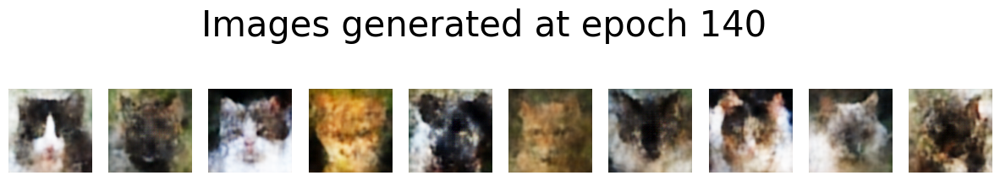

Loss at epoch 140: 0.2927, Classifier loss: 0.1474, Loss DDPM: 0.1373


Epoch 141/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 141: 0.2925, Classifier loss: 0.1586, Loss DDPM: 0.1541


Epoch 142/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 142: 0.2924, Classifier loss: 0.0890, Loss DDPM: 0.1579


Epoch 143/200: 100%|██████████| 147/147 [00:27<00:00,  5.40it/s]


Loss at epoch 143: 0.2945, Classifier loss: 0.1695, Loss DDPM: 0.1988


Epoch 144/200: 100%|██████████| 147/147 [00:27<00:00,  5.40it/s]


Loss at epoch 144: 0.2931, Classifier loss: 0.1038, Loss DDPM: 0.1653


Epoch 145/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 145: 0.2940, Classifier loss: 0.1167, Loss DDPM: 0.2022


Epoch 146/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 146: 0.2931, Classifier loss: 0.0987, Loss DDPM: 0.2132


Epoch 147/200: 100%|██████████| 147/147 [00:27<00:00,  5.33it/s]


Loss at epoch 147: 0.2906, Classifier loss: 0.0804, Loss DDPM: 0.1868


Epoch 148/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 148: 0.2944, Classifier loss: 0.1085, Loss DDPM: 0.1877


Epoch 149/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 149: 0.2925, Classifier loss: 0.1051, Loss DDPM: 0.1646


Epoch 150/200: 100%|██████████| 147/147 [00:27<00:00,  5.31it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


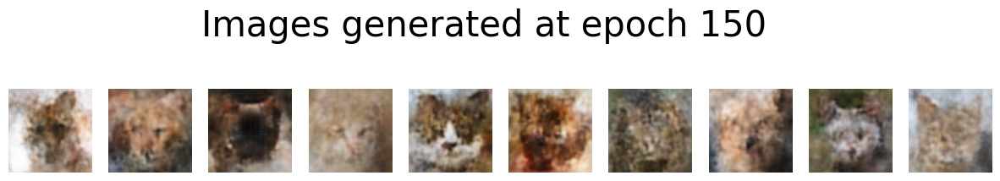

Loss at epoch 150: 0.2949, Classifier loss: 0.1307, Loss DDPM: 0.1941


Epoch 151/200: 100%|██████████| 147/147 [00:27<00:00,  5.28it/s]


Loss at epoch 151: 0.2915, Classifier loss: 0.0966, Loss DDPM: 0.1811


Epoch 152/200: 100%|██████████| 147/147 [00:27<00:00,  5.30it/s]


Loss at epoch 152: 0.2928, Classifier loss: 0.0624, Loss DDPM: 0.2126


Epoch 153/200: 100%|██████████| 147/147 [00:27<00:00,  5.31it/s]


Loss at epoch 153: 0.2931, Classifier loss: 0.1516, Loss DDPM: 0.1794


Epoch 154/200: 100%|██████████| 147/147 [00:27<00:00,  5.29it/s]


Loss at epoch 154: 0.2925, Classifier loss: 0.1280, Loss DDPM: 0.1676


Epoch 155/200: 100%|██████████| 147/147 [00:27<00:00,  5.31it/s]


Loss at epoch 155: 0.2911, Classifier loss: 0.1054, Loss DDPM: 0.1273


Epoch 156/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 156: 0.2910, Classifier loss: 0.1595, Loss DDPM: 0.1597


Epoch 157/200: 100%|██████████| 147/147 [00:27<00:00,  5.31it/s]


Loss at epoch 157: 0.2937, Classifier loss: 0.0914, Loss DDPM: 0.2403


Epoch 158/200: 100%|██████████| 147/147 [00:27<00:00,  5.29it/s]


Loss at epoch 158: 0.2925, Classifier loss: 0.1238, Loss DDPM: 0.1688


Epoch 159/200: 100%|██████████| 147/147 [00:27<00:00,  5.33it/s]


Loss at epoch 159: 0.2911, Classifier loss: 0.1093, Loss DDPM: 0.2281


Epoch 160/200: 100%|██████████| 147/147 [00:27<00:00,  5.33it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


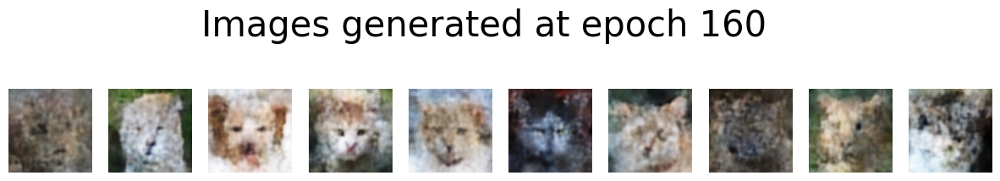

Loss at epoch 160: 0.2938, Classifier loss: 0.0937, Loss DDPM: 0.1818


Epoch 161/200: 100%|██████████| 147/147 [00:27<00:00,  5.39it/s]


Loss at epoch 161: 0.2918, Classifier loss: 0.0999, Loss DDPM: 0.1996


Epoch 162/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 162: 0.2911, Classifier loss: 0.1040, Loss DDPM: 0.1751


Epoch 163/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 163: 0.2898, Classifier loss: 0.0949, Loss DDPM: 0.1831


Epoch 164/200: 100%|██████████| 147/147 [00:27<00:00,  5.36it/s]


Loss at epoch 164: 0.2919, Classifier loss: 0.1296, Loss DDPM: 0.2261


Epoch 165/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 165: 0.2917, Classifier loss: 0.1316, Loss DDPM: 0.1845


Epoch 166/200: 100%|██████████| 147/147 [00:27<00:00,  5.32it/s]


Loss at epoch 166: 0.2904, Classifier loss: 0.1008, Loss DDPM: 0.1726


Epoch 167/200: 100%|██████████| 147/147 [00:27<00:00,  5.37it/s]


Loss at epoch 167: 0.2900, Classifier loss: 0.1051, Loss DDPM: 0.1177


Epoch 168/200: 100%|██████████| 147/147 [00:27<00:00,  5.38it/s]


Loss at epoch 168: 0.2906, Classifier loss: 0.1097, Loss DDPM: 0.1933


Epoch 169/200: 100%|██████████| 147/147 [00:27<00:00,  5.36it/s]


Loss at epoch 169: 0.2902, Classifier loss: 0.0822, Loss DDPM: 0.2035


Epoch 170/200: 100%|██████████| 147/147 [00:27<00:00,  5.28it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


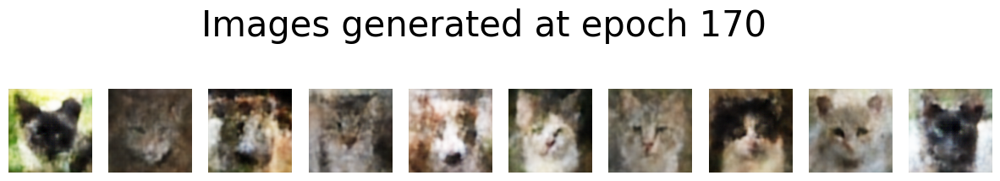

Loss at epoch 170: 0.2889, Classifier loss: 0.1198, Loss DDPM: 0.2096


Epoch 171/200: 100%|██████████| 147/147 [00:27<00:00,  5.28it/s]


Loss at epoch 171: 0.2894, Classifier loss: 0.0658, Loss DDPM: 0.1902


Epoch 172/200: 100%|██████████| 147/147 [00:28<00:00,  5.17it/s]


Loss at epoch 172: 0.2894, Classifier loss: 0.1077, Loss DDPM: 0.2317


Epoch 173/200: 100%|██████████| 147/147 [00:28<00:00,  5.19it/s]


Loss at epoch 173: 0.2904, Classifier loss: 0.0998, Loss DDPM: 0.1797


Epoch 174/200: 100%|██████████| 147/147 [00:28<00:00,  5.21it/s]


Loss at epoch 174: 0.2895, Classifier loss: 0.1240, Loss DDPM: 0.2312


Epoch 175/200: 100%|██████████| 147/147 [00:27<00:00,  5.29it/s]


Loss at epoch 175: 0.2901, Classifier loss: 0.1295, Loss DDPM: 0.1479


Epoch 176/200: 100%|██████████| 147/147 [00:28<00:00,  5.24it/s]


Loss at epoch 176: 0.2861, Classifier loss: 0.1157, Loss DDPM: 0.2075


Epoch 177/200: 100%|██████████| 147/147 [00:27<00:00,  5.28it/s]


Loss at epoch 177: 0.2869, Classifier loss: 0.0917, Loss DDPM: 0.2042


Epoch 178/200: 100%|██████████| 147/147 [00:27<00:00,  5.29it/s]


Loss at epoch 178: 0.2876, Classifier loss: 0.1273, Loss DDPM: 0.1555


Epoch 179/200: 100%|██████████| 147/147 [00:27<00:00,  5.28it/s]


Loss at epoch 179: 0.2908, Classifier loss: 0.1309, Loss DDPM: 0.2165


Epoch 180/200: 100%|██████████| 147/147 [00:27<00:00,  5.33it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


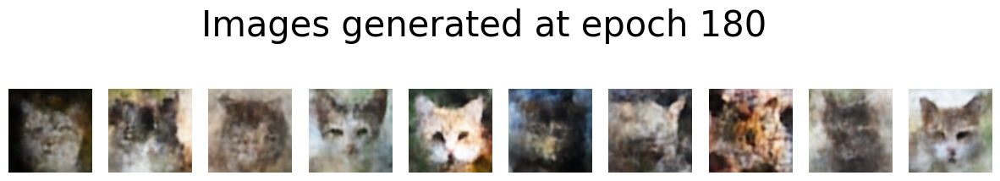

Loss at epoch 180: 0.2878, Classifier loss: 0.1014, Loss DDPM: 0.2593


Epoch 181/200: 100%|██████████| 147/147 [00:27<00:00,  5.32it/s]


Loss at epoch 181: 0.2883, Classifier loss: 0.1300, Loss DDPM: 0.1797


Epoch 182/200: 100%|██████████| 147/147 [00:27<00:00,  5.31it/s]


Loss at epoch 182: 0.2883, Classifier loss: 0.1337, Loss DDPM: 0.1795


Epoch 183/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 183: 0.2899, Classifier loss: 0.1109, Loss DDPM: 0.2091


Epoch 184/200: 100%|██████████| 147/147 [00:27<00:00,  5.27it/s]


Loss at epoch 184: 0.2878, Classifier loss: 0.1013, Loss DDPM: 0.2005


Epoch 185/200: 100%|██████████| 147/147 [00:28<00:00,  5.25it/s]


Loss at epoch 185: 0.2894, Classifier loss: 0.1080, Loss DDPM: 0.1550


Epoch 186/200: 100%|██████████| 147/147 [00:28<00:00,  5.25it/s]


Loss at epoch 186: 0.2875, Classifier loss: 0.1016, Loss DDPM: 0.1732


Epoch 187/200: 100%|██████████| 147/147 [00:27<00:00,  5.29it/s]


Loss at epoch 187: 0.2890, Classifier loss: 0.1069, Loss DDPM: 0.1727


Epoch 188/200: 100%|██████████| 147/147 [00:27<00:00,  5.31it/s]


Loss at epoch 188: 0.2883, Classifier loss: 0.1288, Loss DDPM: 0.1716


Epoch 189/200: 100%|██████████| 147/147 [00:27<00:00,  5.35it/s]


Loss at epoch 189: 0.2860, Classifier loss: 0.0965, Loss DDPM: 0.1270


Epoch 190/200: 100%|██████████| 147/147 [00:27<00:00,  5.28it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


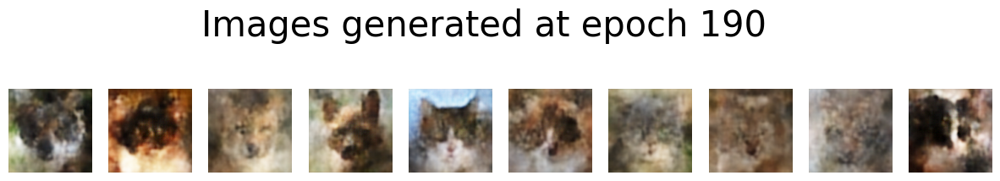

Loss at epoch 190: 0.2878, Classifier loss: 0.1281, Loss DDPM: 0.1382


Epoch 191/200: 100%|██████████| 147/147 [00:27<00:00,  5.33it/s]


Loss at epoch 191: 0.2895, Classifier loss: 0.1225, Loss DDPM: 0.1854


Epoch 192/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 192: 0.2873, Classifier loss: 0.1450, Loss DDPM: 0.1398


Epoch 193/200: 100%|██████████| 147/147 [00:27<00:00,  5.32it/s]


Loss at epoch 193: 0.2880, Classifier loss: 0.1183, Loss DDPM: 0.2048


Epoch 194/200: 100%|██████████| 147/147 [00:27<00:00,  5.32it/s]


Loss at epoch 194: 0.2863, Classifier loss: 0.0805, Loss DDPM: 0.2060


Epoch 195/200: 100%|██████████| 147/147 [00:27<00:00,  5.28it/s]


Loss at epoch 195: 0.2880, Classifier loss: 0.0867, Loss DDPM: 0.1750


Epoch 196/200: 100%|██████████| 147/147 [00:27<00:00,  5.33it/s]


Loss at epoch 196: 0.2890, Classifier loss: 0.1449, Loss DDPM: 0.1645


Epoch 197/200: 100%|██████████| 147/147 [00:27<00:00,  5.31it/s]


Loss at epoch 197: 0.2880, Classifier loss: 0.1018, Loss DDPM: 0.1295


Epoch 198/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 198: 0.2898, Classifier loss: 0.1593, Loss DDPM: 0.1296


Epoch 199/200: 100%|██████████| 147/147 [00:27<00:00,  5.34it/s]


Loss at epoch 199: 0.2887, Classifier loss: 0.0943, Loss DDPM: 0.1844


Epoch 200/200: 100%|██████████| 147/147 [00:27<00:00,  5.32it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


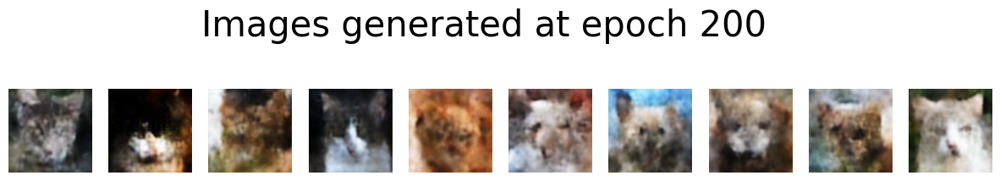

Loss at epoch 200: 0.2861, Classifier loss: 0.0660, Loss DDPM: 0.2093


In [ ]:
# Training
store_path = "CCD_ddpm.pt"
training_loop(ddpm, train_loader, n_epochs, optim=optim.Adam(ddpm.parameters(), lr),optim_cls = optim.Adam(cls.parameters(),lr), device=device, store_path=store_path)

## Generated Images for Cats (class 0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

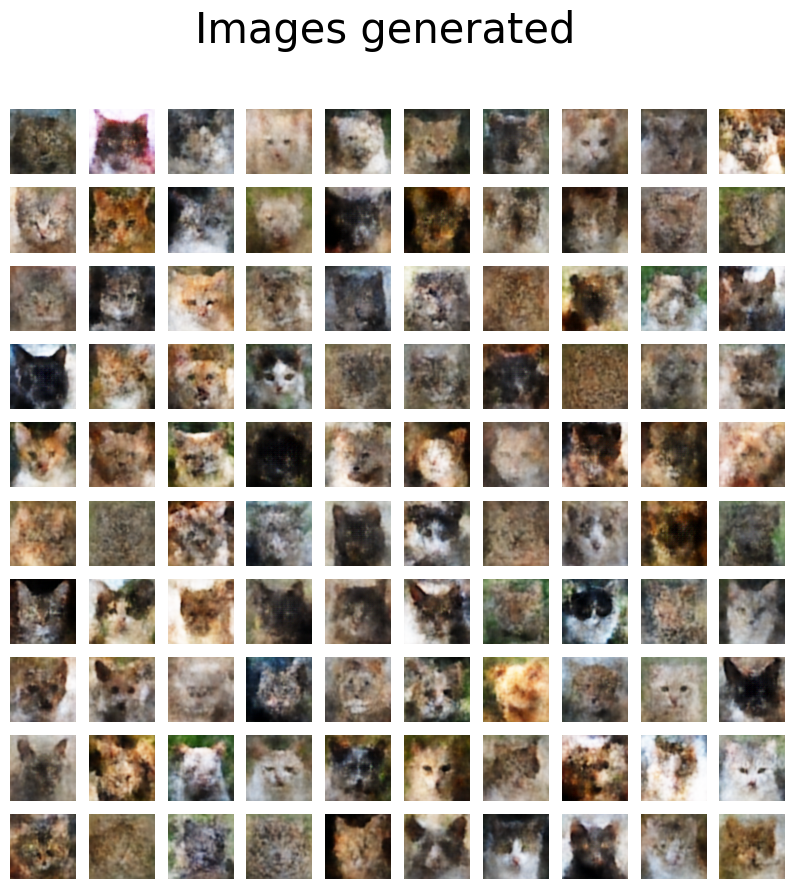

In [ ]:
show_images(generate_new_images(ddpm, n_samples=100, clss=0, device=device), f"Images generated")

## Generated Images for Dogs (class 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

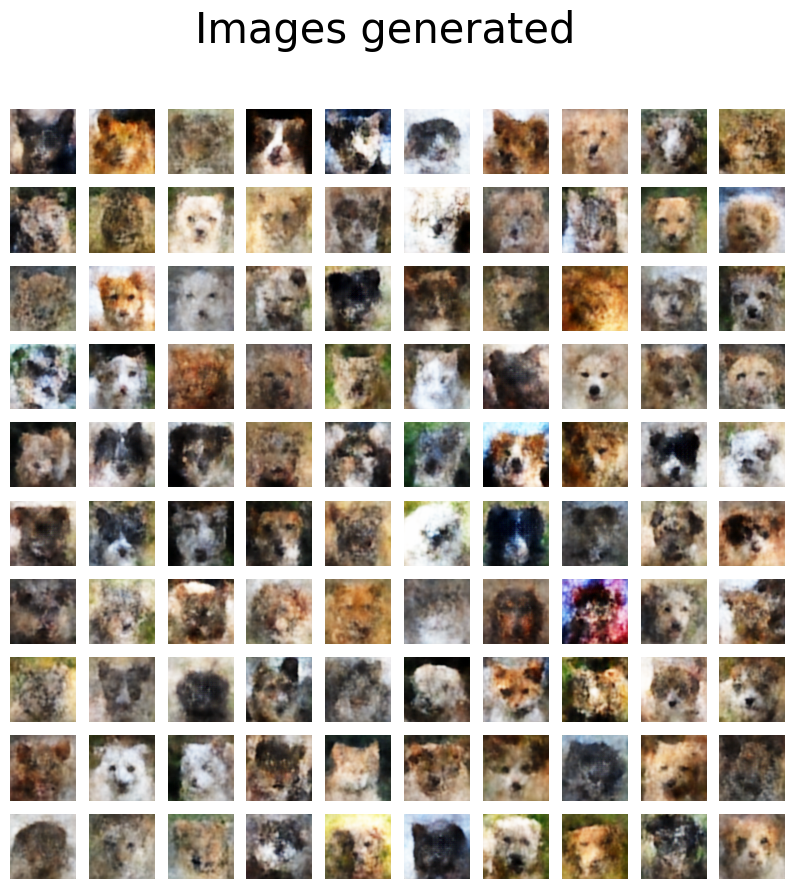

In [ ]:
show_images(generate_new_images(ddpm, n_samples=100, clss=1, device=device), f"Images generated")

## Generated Images for Wild (class 2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

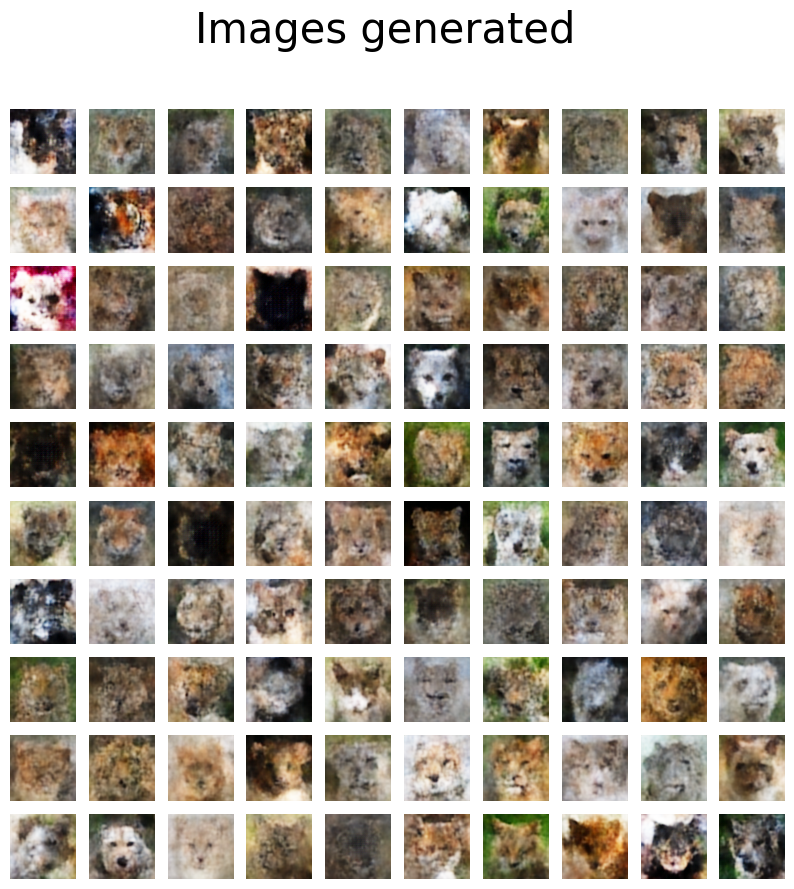

In [ ]:
show_images(generate_new_images(ddpm, n_samples=100, clss=2, device=device), f"Images generated")